# Set Up

In [477]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import laspy
import open3d as o3d
import pptk
import cv2

In [48]:
## params

camera_load_path = 'data/camera_intrinsics.npy'
data_load_path = 'data/00000.npz'
matrices_path = 'data/extrinsics_intrinsics.npz'

data = np.load(data_load_path, allow_pickle=True)

data.files

matrices = matrix = np.load(matrices_path, allow_pickle=True)
matrix.files

camera_ex = matrices['camera_extrinsics'].item()
camera_in = matrices['camera_intrinsics'].item()

In [6]:
# Camera
camera = data['camera_frames'].item()

In [7]:
# keys
camera.keys()

dict_keys(['20438665', '21248038', '21248039'])

In [8]:
# shape
camera['20438665'].shape

(1240, 1616, 3)

In [9]:
# example content
camera['20438665'].shape

(1240, 1616, 3)

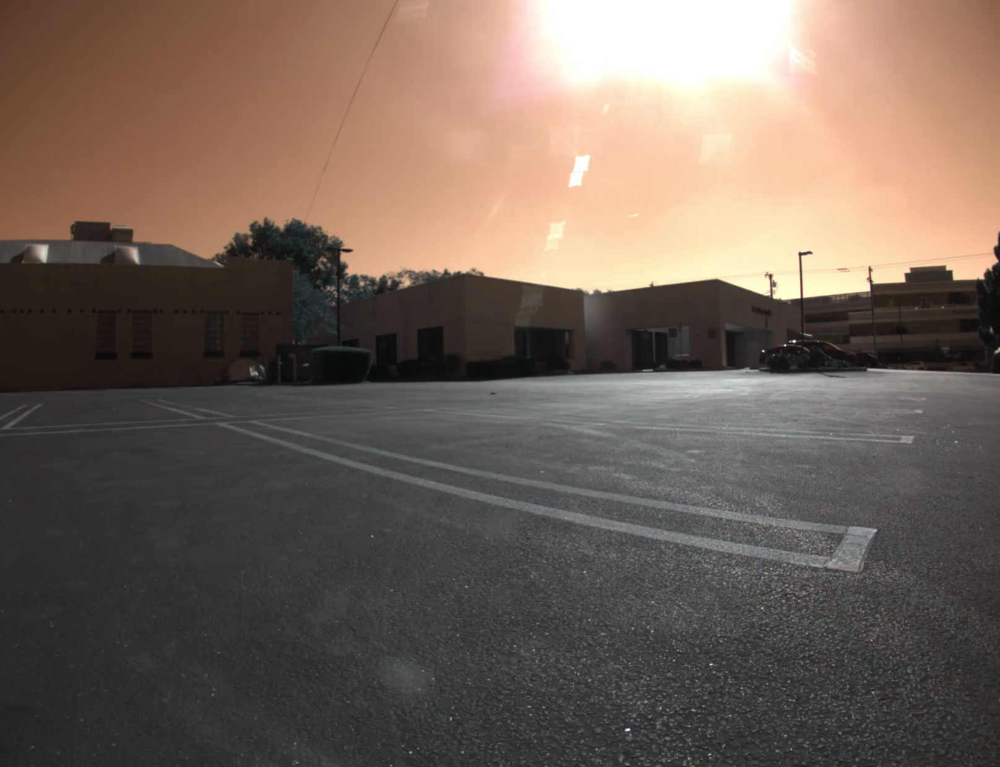

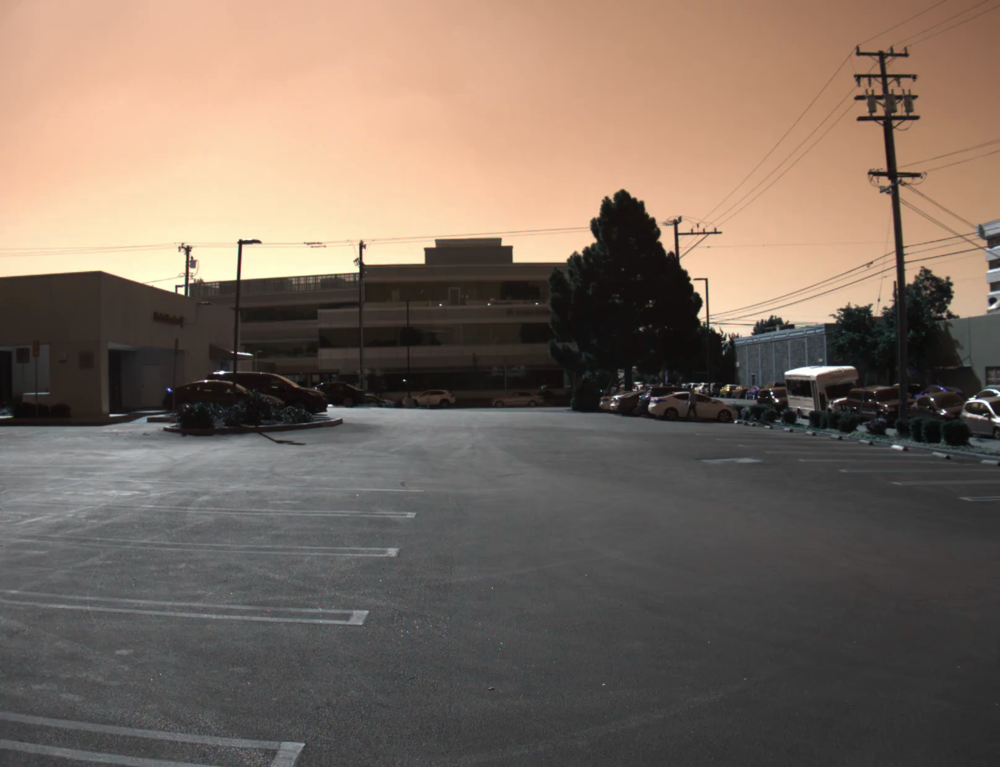

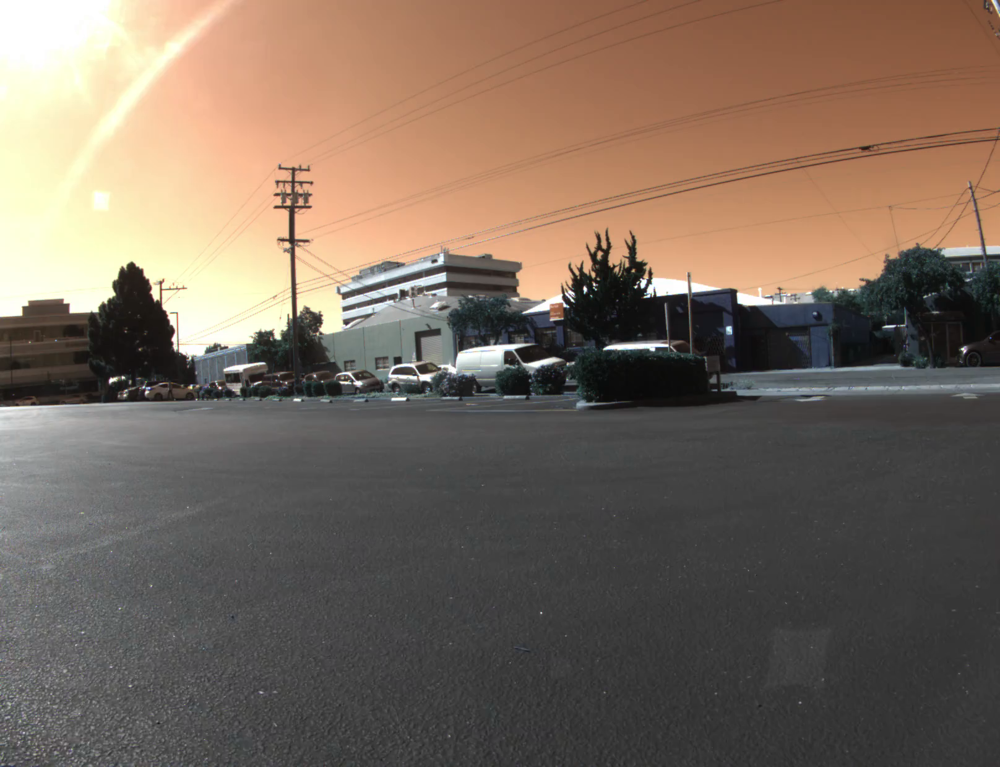

In [10]:
# actual image
display(Image.fromarray(camera['21248038']))
display(Image.fromarray(camera['20438665']))
display(Image.fromarray(camera['21248039']))

# Lidar

## Extrinsic

In [11]:
lidar_ex = data['lidar_extrinsic']
lidar_ex

array([[ 0.02442975, -0.99872376,  0.04420451, -2.3342    ],
       [ 0.9996051 ,  0.0250177 ,  0.01279649, -0.03      ],
       [-0.01388605,  0.04387444,  0.99894054,  1.4       ]])

## Points

In [12]:
lidar_pt = data['lidar_points']

In [13]:
# shape
lidar_pt.shape

(69545, 3)

In [14]:
lidar_pt

array([[-3.22918428e+01, -1.69352086e+01,  1.21533837e+01],
       [-1.86017275e+01, -9.83041016e+00,  7.33045522e+00],
       [-1.85639286e+01, -9.88600285e+00,  7.32847225e+00],
       ...,
       [-4.12119416e+00,  1.46431004e-02,  8.71649125e-01],
       [-4.06766351e+00,  7.63497029e-03,  8.87601788e-01],
       [-4.09465508e+00,  2.15940033e-03,  8.79750468e-01]])

In [15]:
### open3d
# geom = o3d.geometry.PointCloud()
# geom.points = o3d.utility.Vector3dVector(lidar_pt)
# o3d.visualization.draw_geometries([geom])

### pptk
v = pptk.viewer(lidar_pt)

# Radar

In [16]:
radar_pt = data['radar_points'].item()

In [17]:
radar_pt

{'ZRVE1001': array([[  0.28448423,  -0.39485696,   0.39376405],
        [ -0.16695996,  -0.43778064,   0.53086656],
        [ -0.55958707,  -0.38107842,   1.18085111],
        ...,
        [ 28.86555629,  -0.595582  ,  90.71804477],
        [ 28.76230683,  -1.54086603,  90.85146336],
        [-48.52674079,  -0.56173442,  83.85219031]]),
 'ZRVC2001': array([[-8.21349151, -0.6161381 ,  4.9302612 ],
        [-8.31651157, -0.63916214,  4.96388701],
        [-8.33579305, -0.70844868,  4.92102934],
        ...,
        [-2.02223074, -0.28421547, 90.23980174],
        [-1.90636642, -1.5692639 , 90.33550813],
        [ 0.80881361,  1.97677834, 90.34735855]]),
 'ZRVE1002': array([[ -0.20677664,  -0.34057339,   1.65039233],
        [  0.39475492,  -0.37213573,   1.62242464],
        [  0.95255816,  -0.32907628,   1.39956273],
        ...,
        [-68.83628571,   1.07488072,  58.66410207],
        [-68.46137938,   0.9223213 ,  59.26768243],
        [-69.14189845,   1.56498948,  58.45877244]])}

In [18]:
# shape
radar_pt['ZRVC2001'].shape

(630, 3)

In [19]:
radar_all = np.vstack([radar_pt['ZRVC2001'], radar_pt['ZRVE1001'], radar_pt['ZRVE1002']])

In [20]:
# geom = o3d.geometry.PointCloud()
# geom.points = o3d.utility.Vector3dVector(radar_pt['ZRVC2001'])
# o3d.visualization.draw_geometries([geom])

pptk.viewer(radar_all)

# Transformation

## Extrinsics - map: sensor --> vehicle

In [ ]:
# R @ data + T

In [20]:
radar_extrinsic = matrices['radar_extrinsics'].item()

In [21]:
ZRVE1001 = radar_extrinsic['ZRVE1001']
ZRVE1001_R = ZRVE1001[:, :3]
ZRVE1001_T = ZRVE1001[:, 3]

ZRVC2001 = radar_extrinsic['ZRVC2001']
ZRVC2001_R = ZRVC2001[:, :3]
ZRVC2001_T = ZRVC2001[:, 3]

ZRVE1002 = radar_extrinsic['ZRVE1002']
ZRVE1002_R = ZRVE1002[:, :3]
ZRVE1002_T = ZRVE1002[:, 3]

LIDAR = lidar_ex
LIDAR_R = LIDAR[:, :3]
LIDAR_T = LIDAR[:, 3]

In [22]:
ZRVE1001_pt = ZRVE1001_R @ radar_pt['ZRVE1001'].T  + ZRVE1001_T[:, None]

ZRVC2001_pt = ZRVC2001_R @ radar_pt['ZRVC2001'].T  + ZRVC2001_T[:, None]

ZRVE1002_pt = ZRVE1002_R @ radar_pt['ZRVE1002'].T  + ZRVE1002_T[:, None]

LIDAR_pt = LIDAR_R @ lidar_pt.T  + LIDAR_T[:, None]

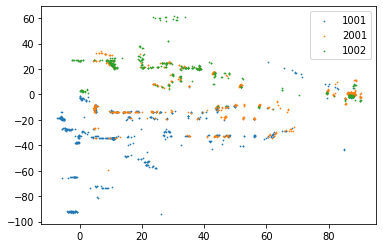

In [23]:
plt.scatter(ZRVE1001_pt[0,:], ZRVE1001_pt[1,:], s=0.5, label='1001')
plt.scatter(ZRVC2001_pt[0,:], ZRVC2001_pt[1,:], s=0.5, label='2001')
plt.scatter(ZRVE1002_pt[0,:], ZRVE1002_pt[1,:], s=0.5, label='1002')
plt.legend()

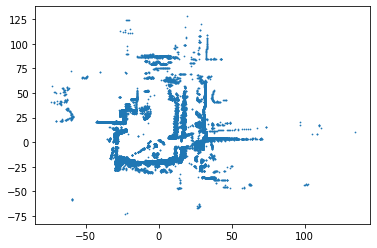

In [24]:
plt.scatter(LIDAR_pt[0,:], LIDAR_pt[1,:], s=0.5)

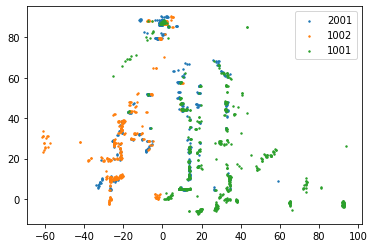

In [25]:
plt.scatter(-ZRVC2001_pt[1,:], ZRVC2001_pt[0,:], s=2, label='2001')
plt.scatter(-ZRVE1002_pt[1,:], ZRVE1002_pt[0,:], s=2, label='1002')
plt.scatter(-ZRVE1001_pt[1,:], ZRVE1001_pt[0,:], s=2, label='1001')
plt.legend()

In [26]:
radar_extrinsic

{'ZRVE1001': array([[ 6.96423400e-01, -1.11022302e-16,  7.17631136e-01,
         -2.02000000e-01],
        [ 7.17631136e-01, -1.11022302e-16, -6.96423400e-01,
         -7.48100000e-01],
        [ 1.66533454e-16,  1.00000000e+00,  2.77555756e-17,
         -6.35000000e-02]]),
 'ZRVC2001': array([[-2.22044605e-16,  1.11022302e-16,  1.00000000e+00,
          2.05000000e-02],
        [ 1.00000000e+00, -2.22044605e-16,  1.11022302e-16,
         -3.86000000e-02],
        [ 1.11022302e-16,  1.00000000e+00, -2.22044605e-16,
         -6.35000000e-02]]),
 'ZRVE1002': array([[-7.17635738e-01, -5.55111512e-17,  6.96418658e-01,
         -1.47300000e-01],
        [ 6.96418658e-01,  1.11022302e-16,  7.17635738e-01,
          6.93500000e-01],
        [-5.55111512e-17,  1.00000000e+00,  1.11022302e-16,
         -6.35000000e-02]])}

In [27]:
ZRVE1001_pt.shape

(3, 672)

In [28]:
ZRVE1001_pt

array([[ 2.78698818e-01,  6.26915469e-02,  2.55705990e-01, ...,
         8.50027424e+01,  8.50265824e+01,  2.61777848e+01],
       [-8.18171762e-01, -1.23762356e+00, -1.97204945e+00, ...,
        -4.32114473e+01, -4.33784581e+01, -9.39690276e+01],
       [-4.58356965e-01, -5.01280643e-01, -4.44578418e-01, ...,
        -6.59082000e-01, -1.60436603e+00, -6.25234416e-01]])

In [29]:
# Need to reverse the x, y axis for rader.
ZRVE1001_global = np.vstack((-ZRVE1001_pt[1, :], ZRVE1001_pt[0, :], ZRVE1001_pt[2, :]))

ZRVC2001_global = np.vstack((-ZRVC2001_pt[1, :], ZRVC2001_pt[0, :], ZRVC2001_pt[2, :]))

ZRVE1002_global = np.vstack((-ZRVE1002_pt[1, :], ZRVE1002_pt[0, :], ZRVE1002_pt[2, :]))


In [598]:
v = pptk.viewer(np.vstack([ZRVE1001_pt.T, ZRVC2001_pt.T, ZRVE1002_pt.T]))

# v.attributes(np.array([1]*len(ZRVE1001_pt[1]) + [2]*len(ZRVC2001_pt[1]) + [3]*len(ZRVE1002_pt[1]) + [0]*len(LIDAR_pt[1])))
v.attributes(np.array([1]*len(ZRVE1001_pt[1]) + [2]*len(ZRVC2001_pt[1]) + [3]*len(ZRVE1002_pt[1])))
v.set(point_size=0.1)

In [658]:
def radar_to_vehicle(radar_pc, radar_extrinsics):
    '''
    Function that takes radar point cloud in radar coordinates and transform to vehicle/global coordinates.

    Params:
    - radar_pc: N x 3 numpy array
    - radar_extrinsics: 3 x 4 numpy array

    Output:
    - radar vehicle coordinates: N x 3 numpy array
    '''
    # radar 3 dim -> 4 dim (with homogeneous coordinate) : N x 4
    homogenous_radar_pc = np.append(radar_pc, [[1]]*len(radar_pc), 1)

    # transform to vehicle coordinates 3 x 4 @ 4 x dims = 3 x dims
    vehicle_coordinates = radar_extrinsics @ homogenous_radar_pc.T

    radar_vehicle = vehicle_coordinates
    return radar_vehicle.T

In [654]:
def vehicle_to_camera(vehicle_pc, camera_extrinsics):
    # decompose into rotational and translational
#     camera_extrinsics_hom = np.vstack((camera_extrinsics,[[0,0,0,1]]))
    camera_extrinsics_hom = camera_extrinsics

    camera_extrinsics_hom_inv = np.linalg.inv(camera_extrinsics_hom)

#     homogenous_vehicle_pc = np.append(vehicle_pc, [[1]]*len(vehicle_pc), 1)
    homogenous_vehicle_pc = vehicle_pc

    # 4x4 @ 4xN = 4xN
    camera_coordinates = camera_extrinsics_hom_inv @ homogenous_vehicle_pc.T
    
    # N x 4
    return camera_coordinates.T

In [650]:
def camera_to_image(camera_pt, camera_intrinsics):
    # decompose intrinsics
    in_matrix, distortion = camera_intrinsics
    
    in_matrix_hom = np.hstack((in_matrix, [[1]]*3))

    # 3x4 @ 4xN = 3xN
    image_coordinates = in_matrix_hom@camera_pt.T
    
    
    # Divide the x, y components by z to obtain the normalized image coordinates
    image_coordinates = image_coordinates / image_coordinates[2, :]
    
    # Transpose the resulting array to get shape (2, N)
    image_coordinates = image_coordinates[:2, :].T
    
    return image_coordinates

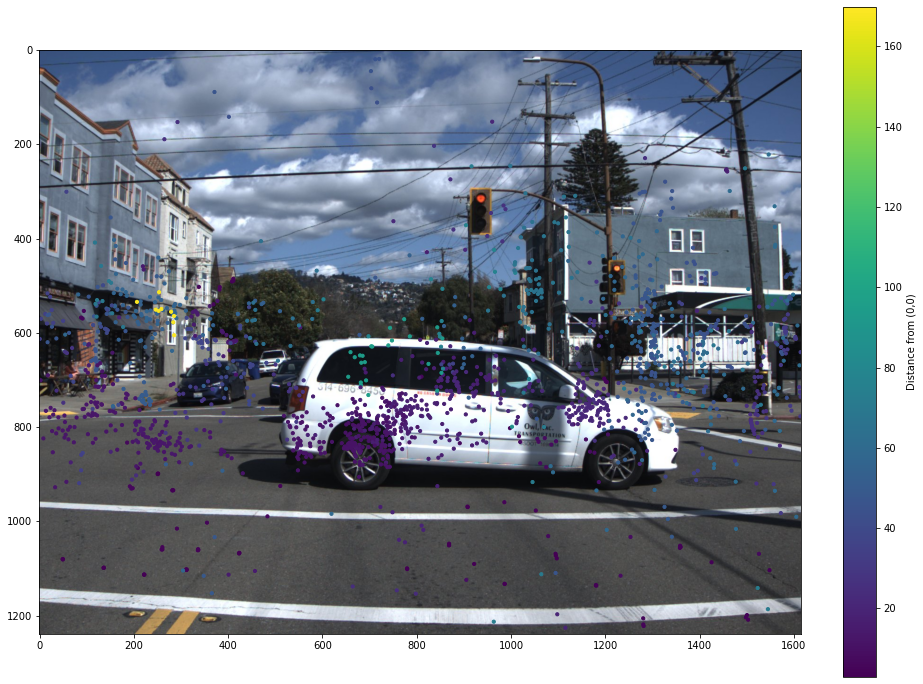

In [656]:
draw_radar_on_img(data, camera_ex, camera_in, camera_num='20438665')

In [54]:
radar_vehicle = radar_to_vehicle(radar_pt['ZRVE1002'], radar_extrinsic['ZRVE1002'])
camera_coor = vehicle_to_camera(radar_vehicle, camera_ex['21248039'])
image_coor = camera_to_image(camera_coor, camera_in['21248039'])

[[ -0.20677664  -0.34057339   1.65039233   1.        ]
 [  0.39475492  -0.37213573   1.62242464   1.        ]
 [  0.95255816  -0.32907628   1.39956273   1.        ]
 ...
 [-68.83628571   1.07488072  58.66410207   1.        ]
 [-68.46137938   0.9223213   59.26768243   1.        ]
 [-69.14189845   1.56498948  58.45877244   1.        ]]


In [293]:
def radar_to_img(radar_pt, radar_extrinsics, camera_extrinsics, camera_intrinsics):
    radar_vehicle = radar_to_vehicle(radar_pt, radar_extrinsics)
    camera_coor = vehicle_to_camera(radar_vehicle, camera_extrinsics)
    image_coor = camera_to_image(camera_coor, camera_intrinsics)
    x, y = image_coor[:,0], image_coor[:,1]
    return x,y

In [53]:
x,y = radar_to_img(radar_pt['ZRVE1002'], radar_extrinsic['ZRVE1002'], camera_ex['21248039'], camera_in['21248039'])

[[ -0.20677664  -0.34057339   1.65039233   1.        ]
 [  0.39475492  -0.37213573   1.62242464   1.        ]
 [  0.95255816  -0.32907628   1.39956273   1.        ]
 ...
 [-68.83628571   1.07488072  58.66410207   1.        ]
 [-68.46137938   0.9223213   59.26768243   1.        ]
 [-69.14189845   1.56498948  58.45877244   1.        ]]


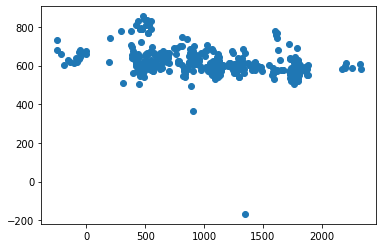

In [704]:
plt.scatter(x, y)

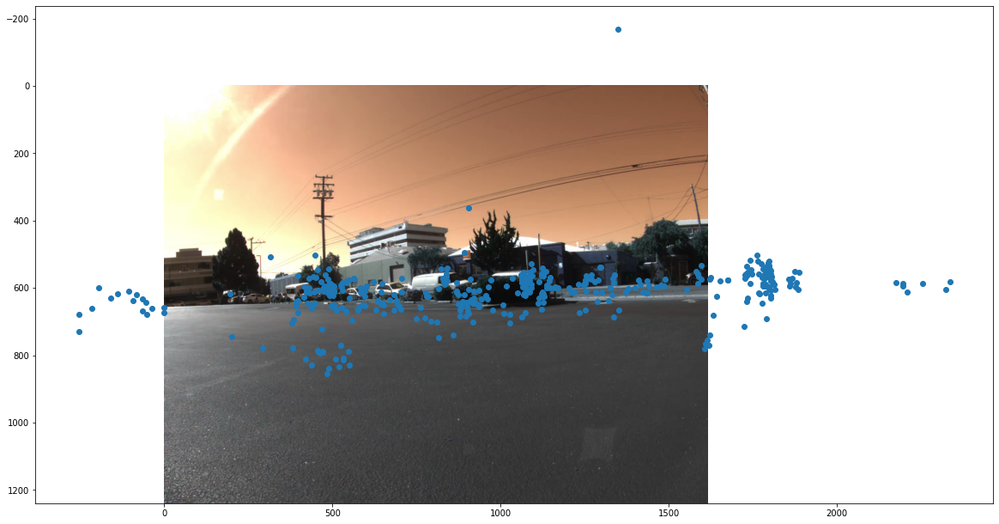

In [705]:
plt.figure(figsize=(20,20))
implot = plt.imshow(camera['21248039'])
plt.scatter(image_coor[:,0], image_coor[:,1])

In [632]:
camera['20438665'].shape

(1240, 1616, 3)

In [718]:
x,y = radar_to_img(radar_pt['ZRVE1002'], radar_extrinsic['ZRVE1002'], camera_ex['20438665'], camera_in['20438665'])

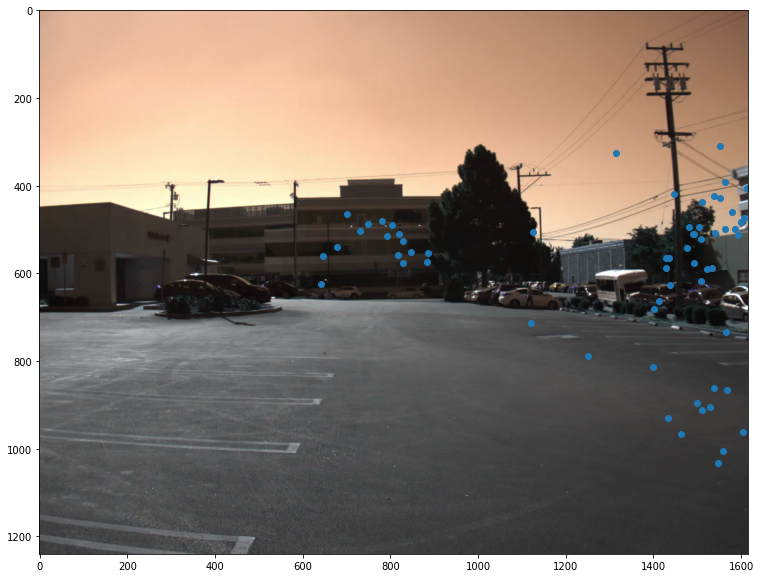

In [719]:
plt.figure(figsize=(20,10))
points = [(i,j) for i,j in list(zip(x,y)) if 0<i<1616 and 0<j<1240]
implot = plt.imshow(camera['20438665'])
plt.scatter([p[0] for p in points], [p[1] for p in points])

## NEW Data

In [240]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
import plotly.graph_objs as go

In [261]:
radar_all.shape

(1706, 3)

In [616]:
data_dp = np.load('data/00000_doppler.npy', allow_pickle=True).item()
camera_load_path = 'data/camera_intrinsics.npy'
data_load_path = 'data/00000_doppler.npy'
matrices_path = 'data/extrinsic_intrinsics.npy'

In [659]:
matrices = np.load(matrices_path, allow_pickle=True).item()
matrices

{'lidar': array([[ 0.02442975, -0.99872376,  0.04420451, -2.3342    ],
        [ 0.9996051 ,  0.0250177 ,  0.01279649, -0.03      ],
        [-0.01388605,  0.04387444,  0.99894054,  1.4       ],
        [ 0.        ,  0.        ,  0.        ,  1.        ]]),
 'ZRVC2001': array([[ 4.99997917e-03,  3.88578059e-16,  9.99987500e-01,
          2.05000000e-02],
        [ 9.99987500e-01, -2.77555756e-16, -4.99997917e-03,
         -3.86000000e-02],
        [ 2.22044605e-16,  1.00000000e+00, -4.44089210e-16,
         -6.35000000e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          1.00000000e+00]]),
 'ZRVE1001': array([[ 7.00002836e-01,  1.66533454e-16,  7.14140063e-01,
         -2.02000000e-01],
        [ 7.14140063e-01, -4.44089210e-16, -7.00002836e-01,
         -7.48100000e-01],
        [ 1.66533454e-16,  1.00000000e+00, -4.44089210e-16,
         -6.35000000e-02],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          1.00000000e+00]]),
 'ZRVE1002': arra

In [618]:
camera_ex = {}
camera_ex['20438665'] = matrices['camera_extrinsic_20438665']
camera_ex['21248038'] = matrices['camera_extrinsic_21248038']
camera_ex['21248039'] = matrices['camera_extrinsic_21248039']
camera_in = {}
camera_in['20438665'] = matrices['camera_intrinsic_20438665']
camera_in['21248038'] = matrices['camera_intrinsic_21248038']
camera_in['21248039'] = matrices['camera_intrinsic_21248039']
radar_extrinsic = matrices

In [660]:
camera_ex

{'20438665': array([[-0.01813162,  0.0074207 ,  0.99980807, -2.73553242],
        [-0.99962961, -0.02043244, -0.01797673,  0.13392947],
        [ 0.02029512, -0.9997637 ,  0.00778842,  1.22072068],
        [ 0.        ,  0.        ,  0.        ,  1.        ]]),
 '21248038': array([[ 0.75368643, -0.01205455,  0.65712362, -2.40007165],
        [-0.657076  , -0.03575495,  0.75297591,  0.7246745 ],
        [ 0.01441864, -0.99928788, -0.03486878,  1.21488698],
        [ 0.        ,  0.        ,  0.        ,  1.        ]]),
 '21248039': array([[-0.76878577, -0.022216  ,  0.6391204 , -2.51771896],
        [-0.63948116,  0.0178267 , -0.76860006, -0.72183259],
        [ 0.00568181, -0.99959425, -0.02791163,  1.20889033],
        [ 0.        ,  0.        ,  0.        ,  1.        ]])}

In [661]:
data_dp.keys()

dict_keys(['lidar', 'camera_20438665', 'camera_21248038', 'camera_21248039', 'camera_224700382', 'ZRVC2001_points_v01', 'ZRVE1001_points_v01', 'ZRVE1002_points_v01'])

In [662]:
radar_l = radar_to_vehicle(data_dp['ZRVE1002_points_v01'][:,:3], radar_extrinsic['ZRVE1002'])
radar_m = radar_to_vehicle(data_dp['ZRVC2001_points_v01'][:,:3], radar_extrinsic['ZRVC2001'])
radar_r = radar_to_vehicle(data_dp['ZRVE1001_points_v01'][:,:3], radar_extrinsic['ZRVE1001'])
radar_all = np.vstack([radar_l, radar_m, radar_r])

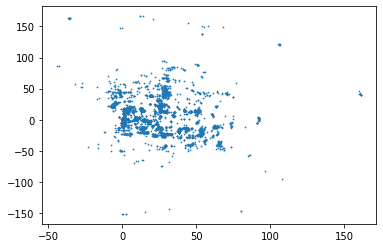

In [665]:
plt.scatter(radar_all[:,0], radar_all[:,1], s=0.5)

In [623]:
# do knn distance to get a good sense of the density

In [624]:
data = radar_all

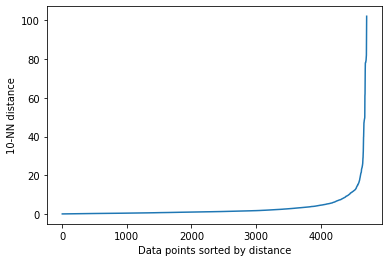

In [625]:
k = 10
knn = NearestNeighbors(n_neighbors=k)
knn.fit(data)
distances, indices = knn.kneighbors(data)
knn_distances = np.sort(distances[:, k-1])
plt.plot(range(len(knn_distances)), knn_distances)
plt.xlabel("Data points sorted by distance")
plt.ylabel(f"{k}-NN distance")
plt.show()
# the elbow point is a good metric for setting the eps for DBScan

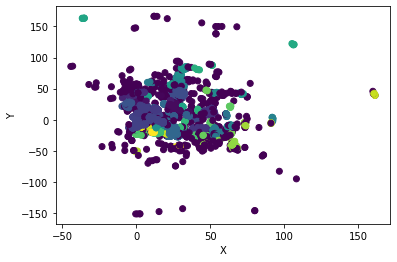

In [675]:
dbscan = DBSCAN(eps=3, min_samples=5)
clusters = dbscan.fit_predict(data)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.scatter(data[:, 0], data[:, 1], c=clusters, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
plt.show()

In [676]:
fig = go.Figure(data=[go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2],
                                   mode='markers',
                                   marker=dict(size=3, color=clusters))])

fig.update_layout(scene=dict(xaxis_title='X',
                             yaxis_title='Y',
                             zaxis_title='Z'))

fig.show()

In [628]:
def draw_radar_on_img(radar_vehicle, camera_extrinsics, camera_intrinsics, camera_num):
    
    camera_coor = vehicle_to_camera(radar_vehicle, camera_extrinsics[camera_num])
    points = camera_to_image(camera_coor, camera_intrinsics[camera_num])
    
    
    filtered_indices = np.where((0 < points[:, 0]) & (points[:, 0] < 1616) & (0 < points[:, 1]) & (points[:, 1] < 1240))
    filtered_points = points[filtered_indices]
#     filtered_labels = clusters[filtered_indices]

    distances = np.sqrt(np.sum(camera_coor**2, axis=1))
    normalized_distances = (distances - distances.min()) / (distances.max() - distances.min())
    cmap = plt.cm.viridis
    colors = cmap(normalized_distances)[filtered_indices]
#     distance_labels = 

    

    plt.figure(figsize=(15,15))
    img = data_dp[f'camera_{camera_num}']
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    implot = plt.imshow(img)
    
    # Add a colorbar to show the color scale
    cbar = plt.colorbar(cm.ScalarMappable(norm=plt.Normalize(np.min(distances), np.max(distances)), cmap=cmap), fraction=0.04, pad=0.05)
    cbar.set_label('Distance from (0,0)')
    
    plt.scatter(filtered_points[:,0], filtered_points[:,1],c=colors,s=10)

In [631]:
draw_radar_on_img(data, camera_ex, camera_in, camera_num='20438665')

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 5 is different from 4)

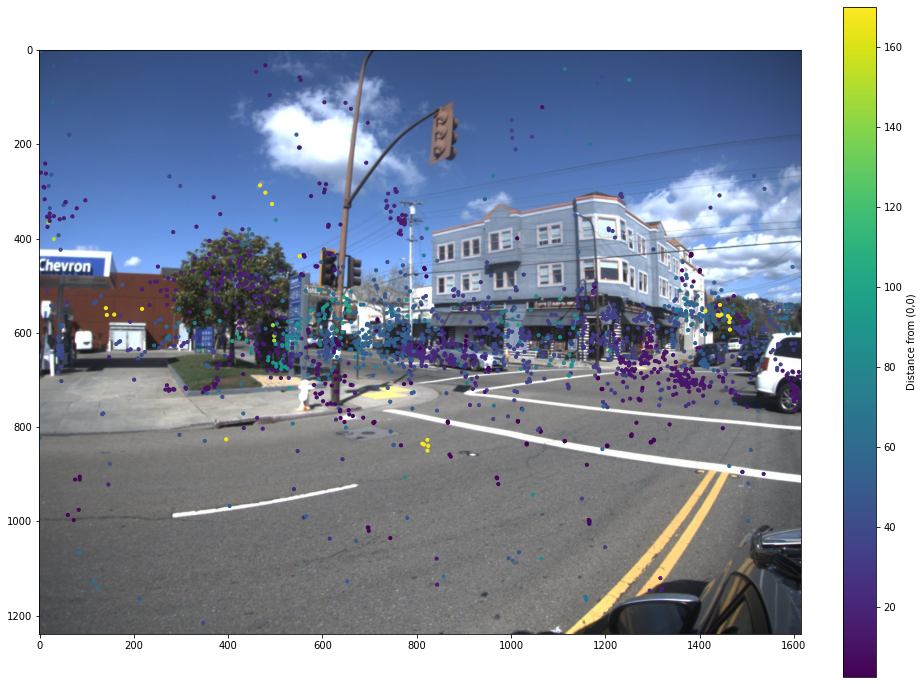

In [666]:
draw_radar_on_img(data, camera_ex, camera_in, camera_num='21248038')

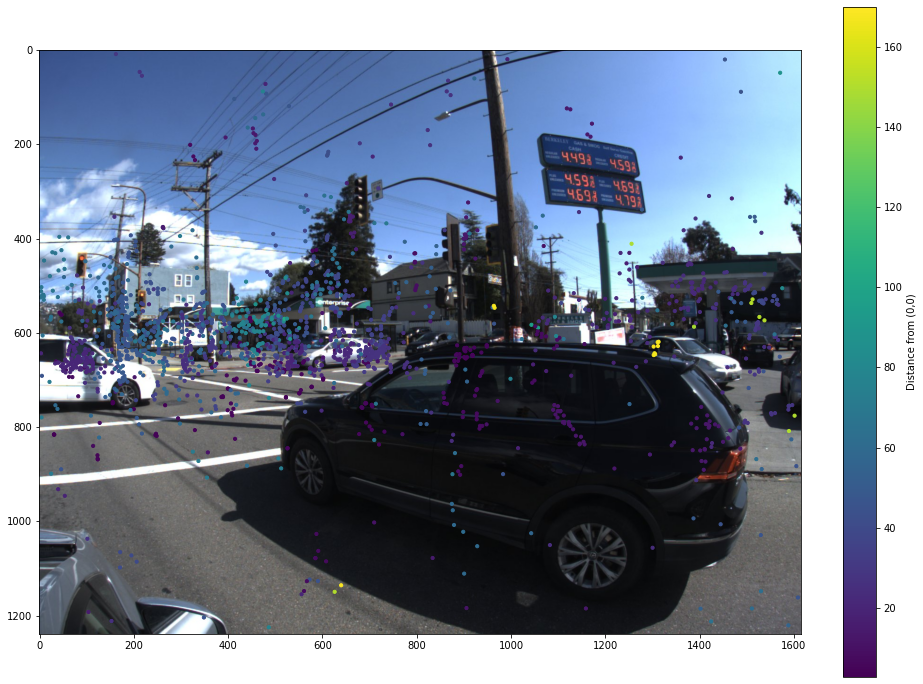

In [667]:
draw_radar_on_img(data, camera_ex, camera_in, camera_num='21248039')

## OLD Data

In [606]:
## params

camera_load_path = 'data/camera_intrinsics.npy'
data_load_path = 'data/00000.npz'
matrices_path = 'data/extrinsics_intrinsics.npz'

data = np.load(data_load_path, allow_pickle=True)



matrices = matrix = np.load(matrices_path, allow_pickle=True)
matrix.files

camera_ex = matrices['camera_extrinsics'].item()
camera_in = matrices['camera_intrinsics'].item()

In [607]:
camera_data = data['camera_frames'].item()

In [608]:
radar_pt = data['radar_points'].item()

In [680]:
radar_l = radar_to_vehicle(radar_pt['ZRVE1002'], radar_extrinsic['ZRVE1002'])
radar_m = radar_to_vehicle(radar_pt['ZRVC2001'], radar_extrinsic['ZRVC2001'])
radar_r = radar_to_vehicle(radar_pt['ZRVE1001'], radar_extrinsic['ZRVE1001'])
radar_all = np.vstack([radar_l, radar_m, radar_r])

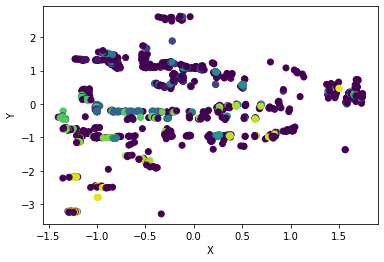

In [755]:
data = radar_all
dbscan = DBSCAN(eps=0.5, min_samples=2)
clusters = dbscan.fit_predict(data)
data = StandardScaler().fit_transform(data)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.scatter(data[:, 0], data[:, 1], c=clusters, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
plt.show()

In [756]:
labeled_data = np.array([d for i,d in enumerate(data) if clusters[i]!=-1])

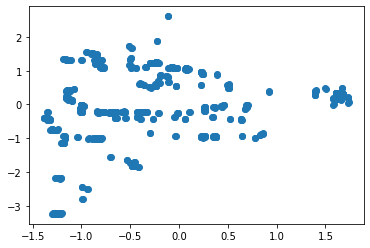

In [757]:
plt.scatter(labeled_data[:, 0], labeled_data[:, 1])

In [739]:
len(np.unique(clusters))

234

In [740]:
fig = go.Figure(data=[go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2],
                                   mode='markers',
                                   marker=dict(size=3, color=clusters))])

fig.update_layout(scene=dict(xaxis_title='X',
                             yaxis_title='Y',
                             zaxis_title='Z'))

fig.show()

In [741]:
def draw_radar_on_img(radar_vehicle, camera_extrinsics, camera_intrinsics, camera_num):
    
    camera_coor = vehicle_to_camera(radar_vehicle, camera_extrinsics[camera_num])
    points = camera_to_image(camera_coor, camera_intrinsics[camera_num])
    
    
    filtered_indices = np.where((0 < points[:, 0]) & (points[:, 0] < 1616) & (0 < points[:, 1]) & (points[:, 1] < 1240))
    filtered_points = points[filtered_indices]
    filtered_labels = clusters[filtered_indices]
    print(filtered_labels)
#     distances = np.sqrt(np.sum(camera_coor**2, axis=1))
    normalized_distances = (filtered_labels - filtered_labels.min()) / (filtered_labels.max() - filtered_labels.min())
    cmap = plt.cm.viridis
    colors = cmap(normalized_distances)
#     distance_labels = 

    

    plt.figure(figsize=(15,15))
    img = camera_data[camera_num]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    implot = plt.imshow(img)
    
    # Add a colorbar to show the color scale
#     cbar = plt.colorbar(cm.ScalarMappable(norm=plt.Normalize(np.min(distances), np.max(distances)), cmap=cmap), fraction=0.04, pad=0.05)
#     cbar.set_label('Distance from (0,0)')
    
    plt.scatter(filtered_points[:,0], filtered_points[:,1],c=colors,s=10)

[ -1  -1  -1  -1  -1  14  -1  23  24  23  24  23  27  27  -1  32  32  -1
  -1  34  34  46  46  -1  -1  47  47  -1  -1  -1  48  48  48  48  -1  48
  -1  -1  -1  -1  -1  -1  -1  50  50  -1  -1  -1  51  51  51  51  -1  51
  -1  -1  52  52  52  -1  53  53  -1  -1  -1  -1  -1  55  55  -1  -1  56
  55  55  -1  -1  -1  -1  -1  -1  57  -1  58  58  59  -1  57  57  60  -1
  59  -1  -1  61  -1  62  60  -1  -1  63  -1  -1  62  63  64  64  65  66
  67  64  64  65  68  -1  67  65  64  -1  68  66  -1  -1  -1  -1  -1  69
  69  -1  -1  -1  -1  -1  -1  -1  -1  70  -1  70  -1  83  83  83  83  83
  83  83  -1  85  -1  85  -1  -1  14  14  90  -1  91  91  -1  92  92  -1
  -1  -1  -1  -1  -1  -1  -1  -1  99  -1  99  99  -1 104 108  -1  -1  -1
  -1  -1  -1  -1  -1  47  47  -1  -1  -1  -1  -1  -1 109  -1  -1  -1 110
 111 110 111 111  -1  -1  -1  -1  -1  -1  -1  -1 113 113  -1  -1  -1  -1
  -1  -1 114 114 114  -1  -1  -1 115  -1  -1 115 115  -1  -1  -1 116 116
 116 116 117 116 116 116 117 116 116 116 116 116 11

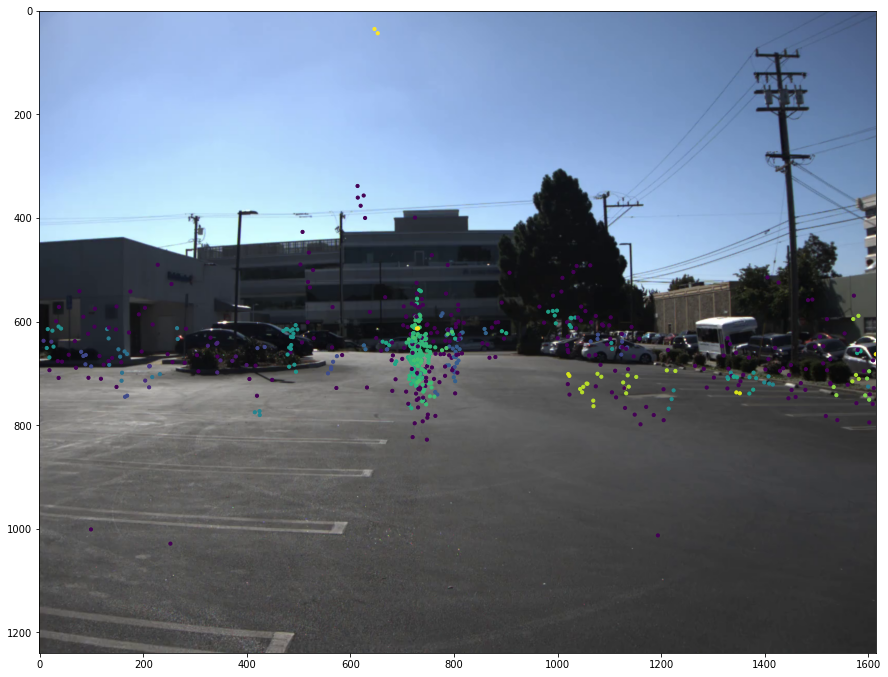

In [742]:
draw_radar_on_img(radar_all, camera_ex, camera_in, camera_num='20438665')

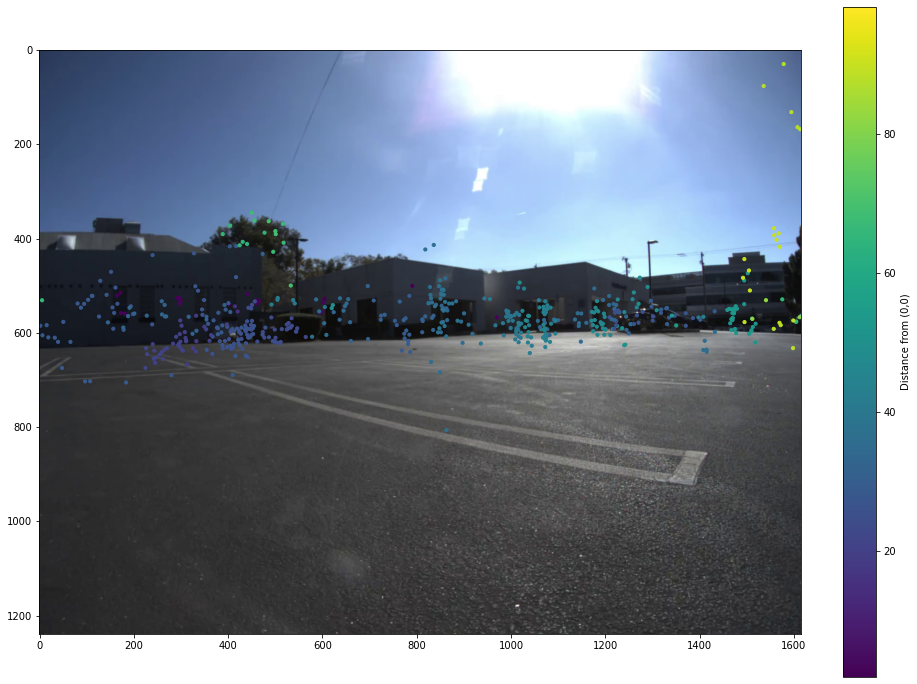

In [561]:
draw_radar_on_img(radar_all, camera_ex, camera_in, camera_num='21248038')

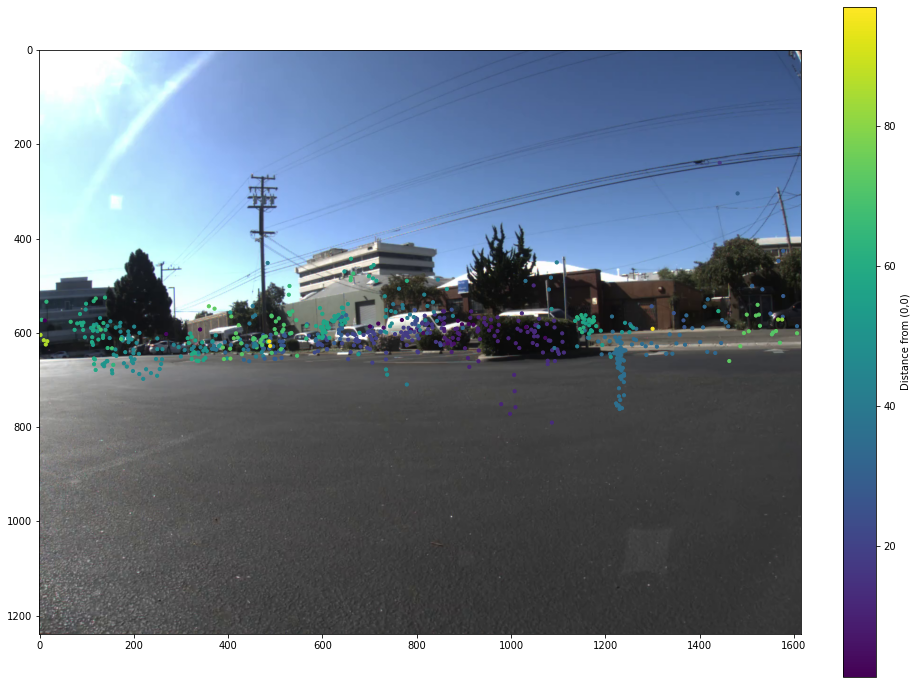

In [562]:
draw_radar_on_img(radar_all, camera_ex, camera_in, camera_num='21248039')